In this notebook, I'll be looking just at a subset of the data I pulled from the Gaia public database, since I cannot handle the larger dataset at this time. Hopefully I will then later be able to pull in the remaining data for cleaning and analysis.

Let's handle the cleaning first and getting things in order.

In [1]:
# The data is located in a subfolder called Data and is split into two files containing 2 million items.
# Let's pull a subset of data from each of the files and combine them into one cleaned subset:
import pandas as pd
import numpy as np

# Load in a subset of 100,000 entries from each of the data files:
subset1 = pd.read_csv('Data/subset_million1.csv', skiprows=lambda x: x in range(100000, 2000000))
subset2 = pd.read_csv('Data/subset_million2.csv', skiprows=lambda x: x in range(100000, 2000000))

# Load in the data files containing the distance estimates for the subsets:
dist1 = pd.read_csv('Data/dist_sample1-result.csv')
dist2 = pd.read_csv('Data/dist_sample2-result.csv')

In [67]:
dist1.head()

,source_id,r_est,r_lo,r_hi
0,47835047936958976,1368.018856,1277.863117,1471.425234
1,47734816283820672,831.438621,455.143972,1637.637152
2,47734816283821312,593.725701,398.531428,1061.354162
3,47728528451650816,529.439125,468.889795,607.394479
4,47710042912979584,1522.189908,986.635425,2385.253461


In [2]:
# Combine the two subsets into one:
subset1['subset'] = pd.Series(np.ones(len(subset1.ra)), index=subset1.index)
subset2['subset'] = pd.Series(np.ones(len(subset2.ra))+1.0, index=subset2.index)
subset = pd.concat([subset1, subset2], ignore_index=True)

# Combine the two distance tables then add columns to the subset table:
dist = pd.concat([dist1, dist2], ignore_index=True)
subset = subset.join(dist.set_index('source_id'), on='source_id')

# Drop the rows where the parallax does not exist (is NaN) or is negative:
subset = subset.dropna(subset=['parallax'])
subset = subset[subset.parallax >= 0.0]

# Drop rows that are considered duplicates:
subset = subset[subset.duplicated_source == False]

In [71]:
subset.head(7)

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,duplicated_source,radial_velocity,radial_velocity_error,teff_val,lum_val,subset,r_est,r_lo,r_hi
0,575388179144704,46.586249,0.451140,1.489403,0.566506,0.245852,0.652412,6.959413,0.939823,-2.869646,0.892436,False,NaN,NaN,NaN,NaN,1.0,1116.827227,748.928101,1713.798538
1,575456898624000,46.629160,0.585416,1.500458,0.636628,3.538279,0.767726,11.109998,1.269826,-15.447752,1.211021,False,NaN,NaN,NaN,NaN,1.0,296.639704,232.068021,408.570033
2,575559977808000,46.619333,0.111619,1.517034,0.108919,1.543781,0.138637,-7.319485,0.202482,-13.131690,0.207530,False,NaN,NaN,4092.17725,0.085104,1.0,636.392779,583.107495,700.057416
3,575559977809920,46.624884,0.293061,1.521894,0.335015,0.667886,0.426745,11.569505,0.653785,2.405117,0.614614,False,NaN,NaN,NaN,NaN,1.0,1076.209874,768.773445,1590.773702
6,575628697283456,46.684003,0.507014,1.514996,0.562390,0.671345,0.669175,3.062812,1.096600,-5.161016,1.044574,False,NaN,NaN,NaN,NaN,1.0,952.605502,629.470827,1517.572847
7,575663057019136,46.660431,0.428231,1.505106,0.506110,1.649634,0.633313,1.398725,0.957734,1.455517,0.965698,False,NaN,NaN,NaN,NaN,1.0,612.514394,425.308370,993.700453
8,575663057021312,46.663176,0.409746,1.512559,0.452759,0.793609,0.541798,3.835206,0.900692,-5.055062,0.868309,False,NaN,NaN,NaN,NaN,1.0,951.716897,656.389168,1467.806195


In [72]:
subset.describe()

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,teff_val,lum_val,subset,r_est,r_lo,r_hi
count,1.448060e+05,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,144806.000000,2884.000000,2884.000000,38264.000000,27605.000000,144806.000000,144806.000000,144806.000000,144806.000000
mean,5.806292e+16,45.667128,0.364385,14.404714,0.311368,1.266455,0.429614,5.364624,0.776553,-6.445491,0.693967,2.624768,2.116272,4937.922456,3.374990,1.502293,1052.323837,821.602990,1432.487008
std,5.448575e+16,2.705760,0.364798,10.360857,0.301396,1.398750,0.425948,14.789071,0.783741,12.691960,0.744909,36.033567,2.545359,608.842748,25.048640,0.499996,610.957379,520.527775,765.761830
min,5.753882e+14,39.397370,0.016614,1.215032,0.013412,0.000027,0.019115,-220.151361,0.032469,-924.894224,0.029633,-214.838053,0.110120,3243.000000,0.029058,1.000000,8.607152,8.600576,8.613737
25%,3.330647e+15,43.320436,0.094899,4.130097,0.080073,0.469400,0.111194,-0.240062,0.197310,-9.062746,0.168166,-18.595147,0.658322,4623.054203,0.227252,1.000000,630.238163,455.751966,872.145084
50%,1.108307e+17,46.204723,0.237451,22.350257,0.204065,0.907139,0.280981,2.936788,0.494771,-4.112792,0.419626,3.976430,1.304933,4972.500000,0.566464,2.000000,929.940575,680.813133,1391.978277
75%,1.122491e+17,47.919100,0.522795,24.612546,0.456171,1.631365,0.621832,8.022298,1.091172,-0.958761,0.926415,23.855239,2.495388,5325.000000,1.430993,2.000000,1342.008153,1063.006154,1845.257483
max,1.496924e+17,65.555744,3.681530,27.274562,2.391855,116.153585,4.106983,1741.859304,5.136050,223.695497,4.661877,242.938548,19.906323,9632.666990,1796.698970,2.000000,7101.204768,6356.833734,8021.140696


In [3]:
subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 144806 entries, 0 to 199999
Data columns (total 20 columns):
source_id                144806 non-null int64
ra                       144806 non-null float64
ra_error                 144806 non-null float64
dec                      144806 non-null float64
dec_error                144806 non-null float64
parallax                 144806 non-null float64
parallax_error           144806 non-null float64
pmra                     144806 non-null float64
pmra_error               144806 non-null float64
pmdec                    144806 non-null float64
pmdec_error              144806 non-null float64
duplicated_source        144806 non-null bool
radial_velocity          2884 non-null float64
radial_velocity_error    2884 non-null float64
teff_val                 38264 non-null float64
lum_val                  27605 non-null float64
subset                   144806 non-null float64
r_est                    144806 non-null float64
r_lo              

In [74]:
len(np.unique(subset.source_id)) == 144806

True

In [6]:
import pickle

with open('Data/cleaned_dataframe_subset.pkl', 'wb') as f:
    pickle.dump(subset, f)

So after all of the cleaning here, I obtained a subset of 144,806 entries that have all 5 dimensions relevant for clustering, having started with 200,000. That's about 72% of the data. If we assume a similar percentage of data for the full subset I downloaded (4 million total) then I should have about 2.9 million good data entries to work with.

Now I can take a look at what I'm working with:

In [7]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
output_notebook()

Loading BokehJS ...

In [8]:
p = figure(plot_width=800, plot_height=800)
p.circle(subset.ra, subset.dec, size=15, line_color="navy", fill_color="navy", fill_alpha=0.4)
show(p)

In [11]:
from bokeh.transform import linear_cmap
from bokeh.util.hex import hexbin

bins = hexbin(subset.ra, subset.dec, 0.2)
p = figure(title="Manual Hex Bin for RA Dec Map", tools="wheel_zoom,pan,reset",
           match_aspect=True, background_fill_color='#440154')
p.grid.visible = False
p.hex_tile(q="q", r="r", size=0.2, line_color=None, source=bins,
           fill_color=linear_cmap('counts', 'Viridis256', 0, max(bins.counts)))
show(p)

The sample is composed of two subsets, shown above in two-dimensional spacial coordinates of RA (East-West) vs. Dec (North-South) on the sky. One of the subsets is slightly more spread out, but they each contain the same number of sources. Let's add the third spacial dimension (distance) and see how that looks:

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

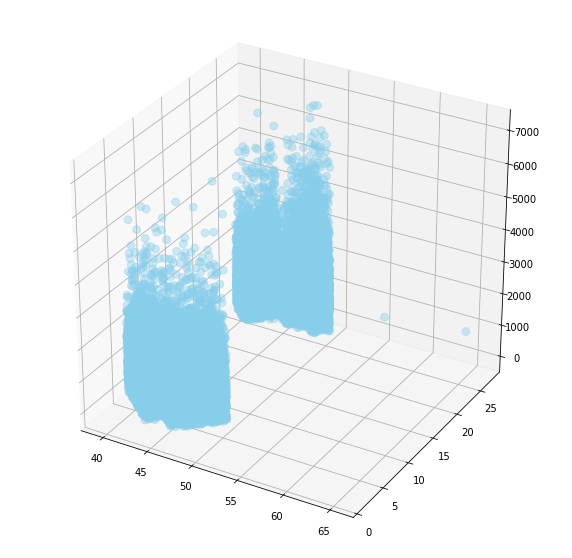

In [75]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(subset['ra'], subset['dec'], subset['r_est'], c='skyblue', s=60, alpha=0.4)
plt.show()

In this case the Z-axis is the distance vector, and we can see that there are more sources closer to us than farther away. This is likely due to the fact that farther sources are more difficult to measure, and *not* because there are fewer stars farther away. In fact, we would expect a higher density of sources closer to the galactic center, rather than lower density. For distance context, the farthest stars are about 7000 parsecs away, and the galactic center is believed to be roughly 8000 parsecs from Earth (one parsec is about 3 light years).

Let's look a bit closer at the distribution of distances (parallactic distance):

In [76]:
p = figure(plot_width=800, plot_height=800)
p.circle(subset.ra, subset.r_est, size=15, line_color="navy", fill_color="navy", fill_alpha=0.3, line_alpha=0.3)
show(p)

In [78]:
bins = hexbin(subset.ra, subset.parallax, 0.2)
p = figure(title="Manual Hex Bin for RA Parallax Map", tools="wheel_zoom,pan,reset",
           match_aspect=True, background_fill_color='#440154', y_range=[-2, 6], x_range=[38, 52])
           #, y_axis_type='log')
p.grid.visible = False
p.hex_tile(q="q", r="r", size=0.2, line_color=None, source=bins,
           fill_color=linear_cmap('counts', 'Viridis256', 0, max(bins.counts)))
show(p)

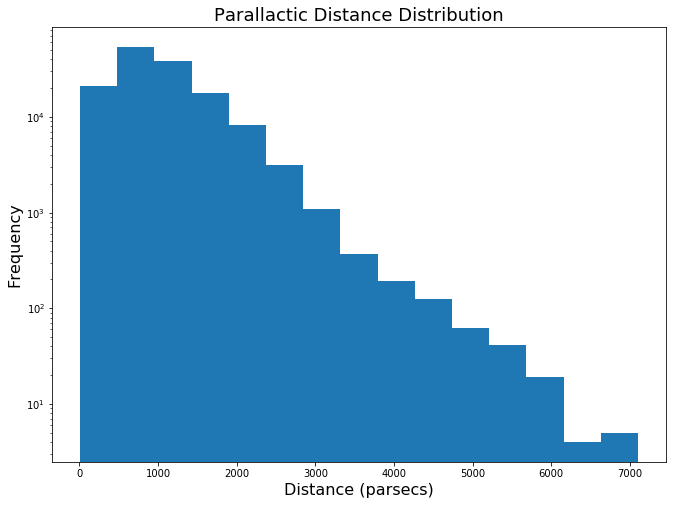

In [80]:
# Plot the distribution:
fig, axes = plt.subplots(figsize=(11,8))
_ = axes.hist(subset.r_est, bins=15)
_ = axes.set_xlabel('Distance (parsecs)', fontsize=16)
_ = axes.set_ylabel('Frequency', fontsize=16)
_ = axes.set_yscale('log')
#_ = axes.set_xscale('log')
_ = plt.title('Parallactic Distance Distribution', fontsize=18)
plt.show()

The above plots show a clear picture of how the distances are distributed amongst our subsample. Most sources are within a few thousand parsecs, with a smaller number of stars closer to the galactic center. This illustrates the power of the Gaia mission, as we previously had few, if any, parallactic distances to stars this close to the galactic center.

Now let's delve into the proper motions of the subsample, which describe the sources' motions on the sky in the tangential directions (i.e. not towards or away from us).

In [36]:
p = figure(plot_width=800, plot_height=800)
p.circle(subset[subset.subset == 1].pmra, subset[subset.subset == 1].pmdec, size=15, line_color="navy", fill_color="navy", fill_alpha=0.3, line_alpha=0.3)
p.circle(subset[subset.subset == 2].pmra, subset[subset.subset == 2].pmdec, size=15, line_color="green", fill_color="green", fill_alpha=0.3, line_alpha=0.3)
show(p)

The above plot shows the proper motions in the RA and Dec directions, in units of milli-arcseconds. The colors separate sources from the two subsets of our subsample, which seem to have somewhat similar motions. But lets convert these to full tangential velocities and see what we can determine about the velocities:

In [82]:
def pm_to_v(pm, d):
    """
    Converts a proper motion column to a velocity column, requiring the distance
    in parsecs. Assumes the proper motions have units of milliarcseconds per year 
    (mas/yr).
    """
    pm_arcsec = pm * 1.0e-3     # Converting to arc seconds per year
    v = pm_arcsec * 4.74 * d    # Answer in kilometers per second
    
    return v

# Convert the proper motions to velocities:
v_ra = pm_to_v(subset.pmra, subset.r_est)
v_dec = pm_to_v(subset.pmdec, subset.r_est)

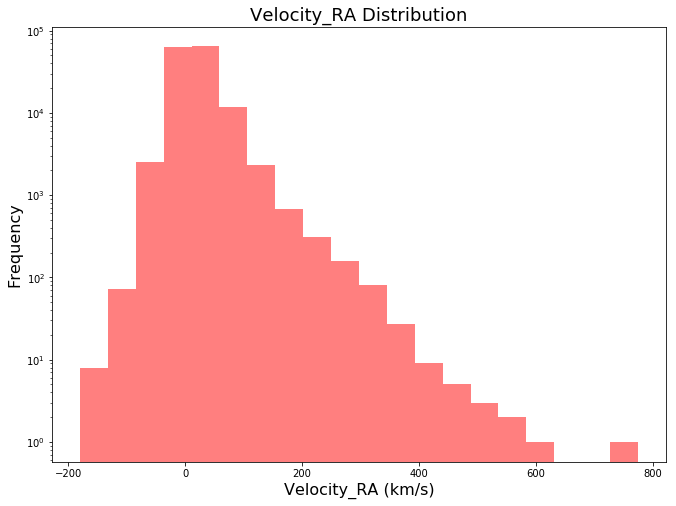

In [83]:
fig, axes = plt.subplots(figsize=(11,8))
_ = axes.hist(v_ra, bins=20, color='red', alpha=0.5)
_ = axes.set_xlabel('Velocity_RA (km/s)', fontsize=16)
_ = axes.set_ylabel('Frequency', fontsize=16)
_ = axes.set_yscale('log')
#_ = axes.set_xscale('log')
_ = plt.title('Velocity_RA Distribution', fontsize=18)
plt.show()

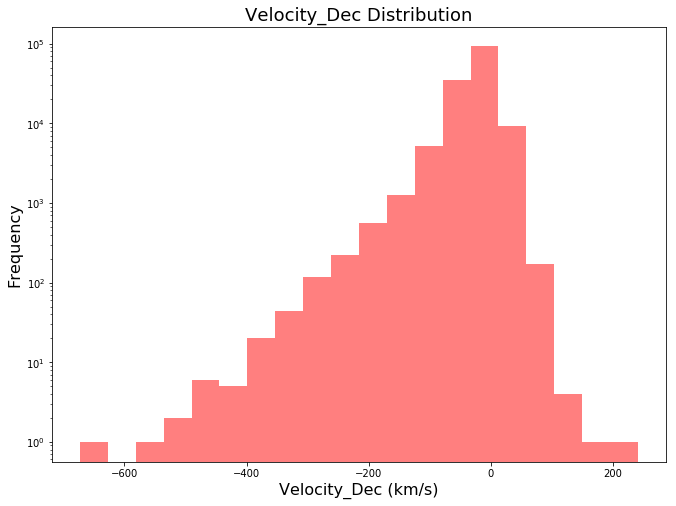

In [84]:
fig, axes = plt.subplots(figsize=(11,8))
_ = axes.hist(v_dec, bins=20, color='red', alpha=0.5)
_ = axes.set_xlabel('Velocity_Dec (km/s)', fontsize=16)
_ = axes.set_ylabel('Frequency', fontsize=16)
_ = axes.set_yscale('log')
#_ = axes.set_xscale('log')
_ = plt.title('Velocity_Dec Distribution', fontsize=18)
plt.show()

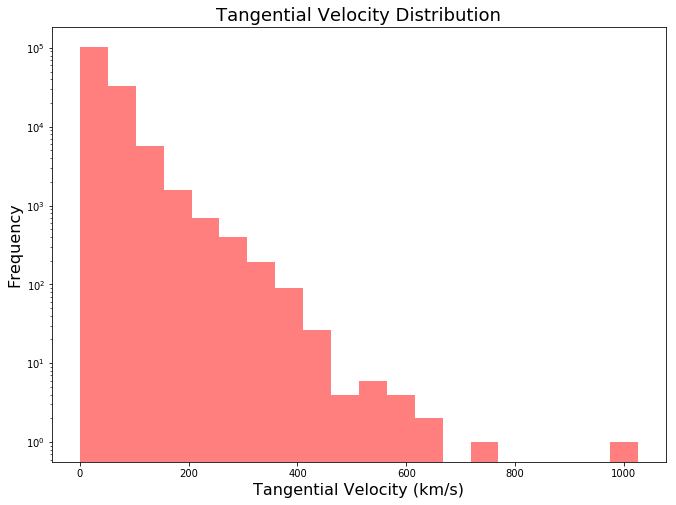

In [85]:
# Figure out total tangential velocity distribution:
v_tan = np.sqrt((v_ra*v_ra) + (v_dec*v_dec))

fig, axes = plt.subplots(figsize=(11,8))
_ = axes.hist(v_tan, bins=20, color='red', alpha=0.5)
_ = axes.set_xlabel('Tangential Velocity (km/s)', fontsize=16)
_ = axes.set_ylabel('Frequency', fontsize=16)
_ = axes.set_yscale('log')
#_ = axes.set_xscale('log')
_ = plt.title('Tangential Velocity Distribution', fontsize=18)
plt.show()

In [88]:
print(len(np.where(v_tan >= 300)[0]))
print(len(np.where(v_tan >= 400)[0]))
print(len(np.where(v_tan >= 550)[0]))
print(len(np.where(v_tan >= 800)[0]))

368
53
10
1


There are some interesting things to notice here. Most of the sources appear to be moving in the northeast direction (positive RA motion, negative Dec motion). Additionally, there are a number of stars moving with very fast total tangential velocities. Most stars in the Milky Way Galaxy are moving with about 300 km/s or less, but 368 stars have higher tangential velocities. There are 53 stars above 400 km/s, which are very high velocity stars. The escape velocity of the Milky Way Galaxy at the Sun's distance is 550 km/s, and there are 10 stars in this subsample of that velocity or higher, which are very likely to be on their way to escaping the Milky Way. And 1 star is near 1000 km/s, which is a "hypervelocity" star, which is speeding incredibly fast out of the galaxy. These stars have been found to be rare, but they are likely to be the product of some large gravitational interactions, and not likely faulty measurements.

Let's see how the distance correlates (if at all) with the tangential velocity:

In [195]:
import scipy.stats as st

# Pearson correlation coefficient for distance vs. tangential velocity
dist_vtan = st.pearsonr(v_tan, subset.r_est)
print('Distance vs Tangential Velocity:\n{}, {}\n'.format(dist_vtan[0], dist_vtan[1]))

p = figure(plot_width=800, plot_height=800)
p.circle(v_tan, subset.r_est, size=15, line_color="navy", fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
show(p)

Distance vs Tangential Velocity:
0.11964628338648642, 0.0



Though the plot seems to look like there's a negative correlation between distance and total tangential velocity, the pearson correlation coefficient suggests that there's actually a slight positive correlation between the two, with a statistically significant p value of effectively 0. Though most of the highest velocity sources are relatively closeby to Earth, which is interesting.

## Statistics

Let's delve more into the inferential statistics portion of our EDA. In particular, let's begin by looking at how the tangential velocities are distributed and whether they differ between the two subsets of our subsample:

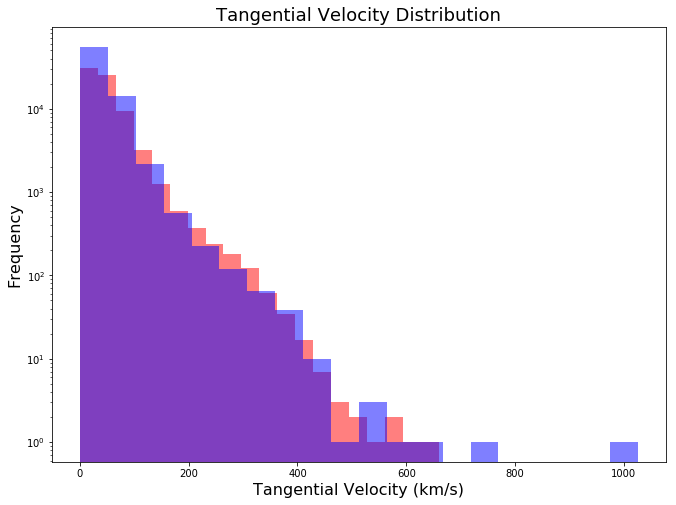

In [98]:
# Separate tangential velocities by subset (different regions):
subset1_ind = np.where(subset.subset==1)[0]
subset2_ind = np.where(subset.subset==2)[0]
v_tan_subset1 = v_tan.iloc[subset1_ind]
v_tan_subset2 = v_tan.iloc[subset2_ind]

# See if the distributions differ:
fig, axes = plt.subplots(figsize=(11,8))
_ = axes.hist(v_tan_subset1, bins=20, color='red', alpha=0.5)
_ = axes.hist(v_tan_subset2, bins=20, color='blue', alpha=0.5)
_ = axes.set_xlabel('Tangential Velocity (km/s)', fontsize=16)
_ = axes.set_ylabel('Frequency', fontsize=16)
_ = axes.set_yscale('log')
#_ = axes.set_xscale('log')
_ = plt.title('Tangential Velocity Distribution', fontsize=18)
plt.show()

Looking at the tangential velocity distributions, there seems to be slight differences, but it's hard to tell by-eye here whether or not they are significantly different. Let's look at their CDFs, which are independent of binning effects:

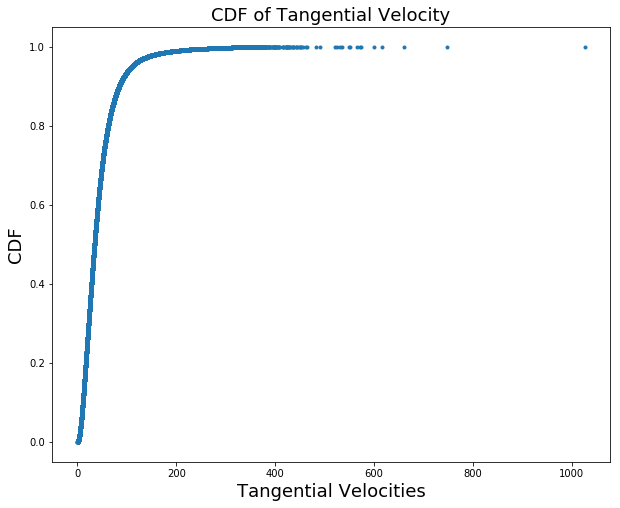

In [103]:
def cdf(data):
    """
    Computes the cumulative distribution function for your data and
    returns the x and y values. Data must be a 1-D array of values.
    
    """
    n_values = len(data)
    
    # Sort the x data, then calculate y:
    x = np.sort(data)
    y = np.arange(1, n_values+1) / n_values
    
    return x, y

vtan_x, vtan_y = cdf(v_tan)

# Plot it up!
fig, axes = plt.subplots(figsize=(10,8))
_ = axes.plot(vtan_x, vtan_y, marker='.', linestyle='none')
#_ = axes.legend(['Normal Dist.', 'Temp. Data'], fontsize=14)
_ = axes.set_xlabel('Tangential Velocities', fontsize=18)
_ = axes.set_ylabel('CDF', fontsize=18)
_ = plt.title('CDF of Tangential Velocity', fontsize=18)
plt.show()

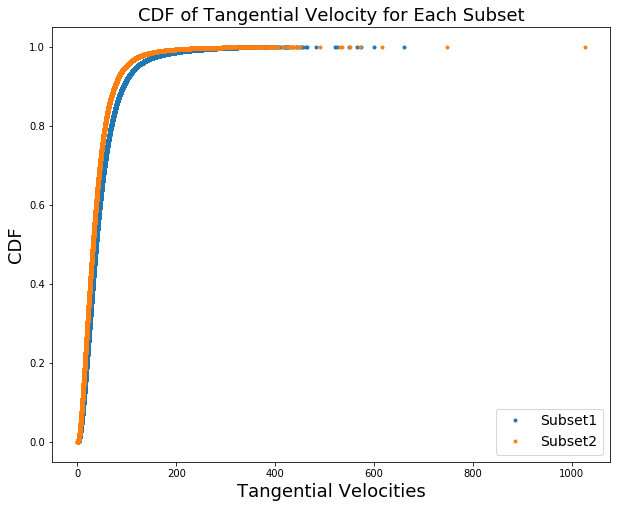

In [104]:
vtan1_x, vtan1_y = cdf(v_tan_subset1)
vtan2_x, vtan2_y = cdf(v_tan_subset2)

# Plot it up!
fig, axes = plt.subplots(figsize=(10,8))
_ = axes.plot(vtan1_x, vtan1_y, marker='.', linestyle='none')
_ = axes.plot(vtan2_x, vtan2_y, marker='.', linestyle='none')
_ = axes.legend(['Subset1', 'Subset2'], fontsize=14)
_ = axes.set_xlabel('Tangential Velocities', fontsize=18)
_ = axes.set_ylabel('CDF', fontsize=18)
_ = plt.title('CDF of Tangential Velocity for Each Subset', fontsize=18)
plt.show()

These CDFs are interesting. It seems like there may be differences between the two subsets after all, as the first subset appears to skew further right. To look at the differences between the two, it'll be good to characterize these distributions. From what I'm seeing, I think they look very close to log-normal distributions. Let's test this out on the full set:

3.4643093135489833 0.8345568531664649


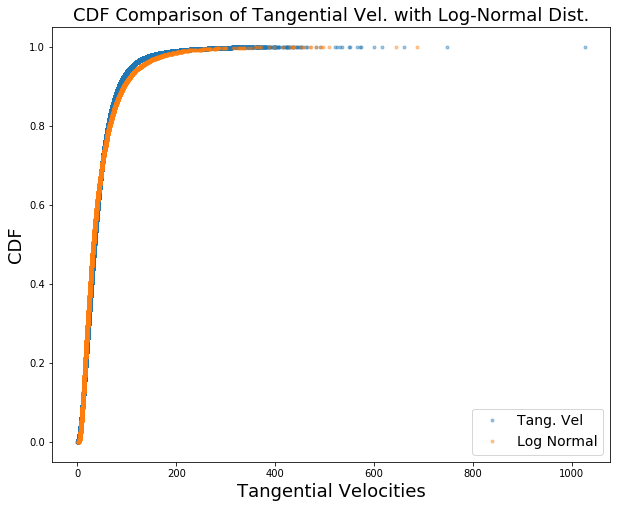

In [116]:
def log_norm_calc_params(data):
    """
    Calculates and outputs the mu and sigma for a log normal distribution
    on your dataset.
    """
    
    log_data = np.log(data)
    
    # Mu is the easiest, it's just the mean of the natural log of your data:
    mu = np.mean(log_data)
    
    # Sigma is a bit more involved:
    n = len(data)
    squared_values_sum = np.sum(log_data * log_data)
    sum_values_squared = np.sum(log_data) ** 2.0
    sigma_squared = ((n*squared_values_sum) - sum_values_squared) / (n*(n-1))
    sigma = np.sqrt(sigma_squared)
    
    return mu, sigma


# Let's compare to a log-normal distribution:
mu_data, sigma_data = log_norm_calc_params(v_tan)
print(mu_data, sigma_data)
log_norm = np.random.lognormal(mu_data, sigma_data, 10000)   # Same mean and std as our data; 10000 points
log_norm_x, log_norm_y = cdf(log_norm)

# Plot it up!
fig, axes = plt.subplots(figsize=(10,8))
_ = axes.plot(vtan_x, vtan_y, marker='.', linestyle='none', alpha=0.4)
_ = axes.plot(log_norm_x, log_norm_y, marker='.', linestyle='none', alpha=0.4)
_ = axes.legend(['Tang. Vel', 'Log Normal'], fontsize=14)
_ = axes.set_xlabel('Tangential Velocities', fontsize=18)
_ = axes.set_ylabel('CDF', fontsize=18)
_ = plt.title('CDF Comparison of Tangential Vel. with Log-Normal Dist.', fontsize=18)
plt.show()

Indeed, the tangential velocity distribution for our sample seems to be well characterized by a log-normal distribution. Let's take this test one step further -- log-normal distributions should (as their name implies) follow a normal (Gaussian) distribution when you take the log, so let's test that out too:

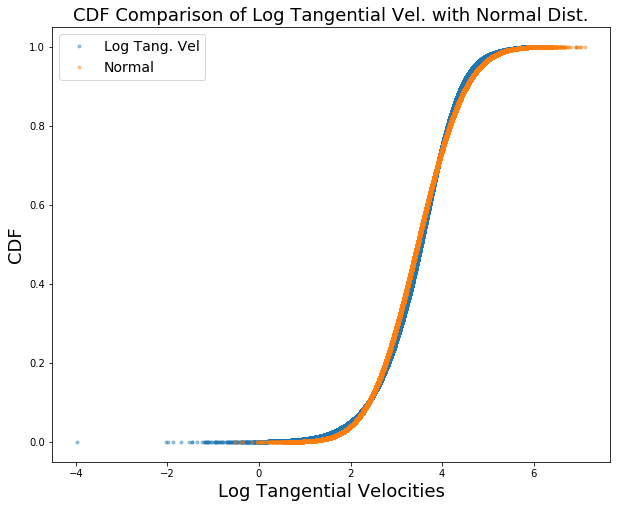

In [122]:
vtan_norm_x, vtan_norm_y = cdf(np.log(v_tan))
norm_x, norm_y = cdf(np.random.normal(mu_data, sigma_data, 300000))

# Plot it up!
fig, axes = plt.subplots(figsize=(10,8))
_ = axes.plot(vtan_norm_x, vtan_norm_y, marker='.', linestyle='none', alpha=0.4)
_ = axes.plot(norm_x, norm_y, marker='.', linestyle='none', alpha=0.4)
_ = axes.legend(['Log Tang. Vel', 'Normal'], fontsize=14)
_ = axes.set_xlabel('Log Tangential Velocities', fontsize=18)
_ = axes.set_ylabel('CDF', fontsize=18)
_ = plt.title('CDF Comparison of Log Tangential Vel. with Normal Dist.', fontsize=18)
plt.show()

Indeed, this seems to pass the test, as the log distribution seems to follow a normal distribution as expected. Now that we know the tangential velocity distributions follow a log-normal distribution, let's use this to characterize its parameters for comparison:

In [132]:
# Let's compare to a log-normal distribution:
mu_data1, sigma_data1 = log_norm_calc_params(v_tan_subset1)
mu_data2, sigma_data2 = log_norm_calc_params(v_tan_subset2)
print(mu_data1, sigma_data1)
print(mu_data2, sigma_data2)

arith_mean1 = np.exp(mu_data1+(0.5*sigma_data1*sigma_data1))
arith_mean2 = np.exp(mu_data2+(0.5*sigma_data2*sigma_data2))
arith_sigma1 = arith_mean1*np.sqrt(np.exp(sigma_data1*sigma_data1) - 1.0)
arith_sigma2 = arith_mean2*np.sqrt(np.exp(sigma_data2*sigma_data2) - 1.0)
print(arith_mean1, arith_sigma1)
print(arith_mean2, arith_sigma2)

3.570632738374827 0.8233026683283777
3.358956518462389 0.8322747478639881
49.876321954549375 49.11219160720453
40.66212812805021 40.64318264044762


Given these parameters for mu and sigma (as well as arithmetic mean and standard deviation), let's run a two-sample mean equivalence test for each subset to see if they have different means:

In [131]:
import scipy.stats as st

# Let's do a z-test to see if the means of the subsets are different:
z_stat = (mu_data2 - mu_data1) / np.sqrt((sigma_data2*sigma_data2/len(v_tan_subset2))
                                         +(sigma_data1*sigma_data1/len(v_tan_subset1)))
# Figure out the 95% confidence intervals:
print('95% confidence interval z-table range: ')
print([st.norm.ppf(.025), st.norm.ppf(.975)])

p = st.norm.cdf(z_stat)
print('Z value = {}'.format(z_stat))
print('p value: {}'.format(p))

95% confidence interval z-table range: 
[-1.9599639845400545, 1.959963984540054]
Z value = -48.6536812268391
p value: 0.0


In [133]:
# Or do we have to use the arithmetic means/sigmas? :
z_stat = (arith_mean2 - arith_mean1) / np.sqrt((arith_sigma2*arith_sigma2/len(v_tan_subset2))
                                         +(arith_sigma1*arith_sigma1/len(v_tan_subset1)))
# Figure out the 95% confidence intervals:
print('95% confidence interval z-table range: ')
print([st.norm.ppf(.025), st.norm.ppf(.975)])

p = st.norm.cdf(z_stat)
print('Z value = {}'.format(z_stat))
print('p value: {}'.format(p))

95% confidence interval z-table range: 
[-1.9599639845400545, 1.959963984540054]
Z value = -38.87538346600176
p value: 0.0


It can now be seen that the two subsets do indeed have statistically significantly different means for their distributions. This is interesting, as it suggests that you'll get different velocities if you look at different parts of the sky (and therefore in different areas of the galaxy).

Now let's look at the smaller sample of stars we have measurements for the luminosity (brightness) and see if we can find anything of interest this way:

In [178]:
lum_subset = subset.dropna(subset=['lum_val'])
lum_subset.describe()
lum_subset.head()

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,duplicated_source,radial_velocity,radial_velocity_error,teff_val,lum_val,subset,r_est,r_lo,r_hi
2,575559977808000,46.619333,0.111619,1.517034,0.108919,1.543781,0.138637,-7.319485,0.202482,-13.131690,0.207530,False,NaN,NaN,4092.17725,0.085104,1.0,636.392779,583.107495,700.057416
15,576010949709824,46.668143,0.035566,1.545455,0.031675,2.936461,0.043657,15.013314,0.068174,14.875077,0.069997,False,23.22248,2.520079,5475.50000,0.610169,1.0,337.288966,332.356954,342.366838
20,576182748381952,46.502658,0.031875,1.439008,0.033171,2.367207,0.039406,2.471327,0.066788,-13.260002,0.069573,False,NaN,NaN,4459.00000,0.154061,1.0,417.412465,410.606385,424.443743
31,576766863932416,46.530596,0.031423,1.472815,0.032551,0.697648,0.038728,12.086103,0.065944,-2.412215,0.068320,False,NaN,NaN,5789.00000,1.442539,1.0,1368.261181,1298.319929,1445.931896
37,577350979485952,46.447700,0.035545,1.487296,0.035582,0.948009,0.046915,-7.995248,0.072395,-4.825499,0.073829,False,NaN,NaN,5430.03760,0.629723,1.0,1021.129360,974.273172,1072.600600


In [148]:
p = figure(plot_width=800, plot_height=800, y_axis_type='log')
p.circle(lum_subset.teff_val, lum_subset.lum_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
# Put where the Sun would be located here:
p.circle(5778, 1.0, size=15, line_color="yellow", 
         fill_color="yellow", fill_alpha=0.7, line_alpha=0.7)
show(p)

In [141]:
p = figure(plot_width=800, plot_height=800, y_axis_type='log')
p.circle(lum_subset.r_est, lum_subset.lum_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4, )
show(p)

In [146]:
p = figure(plot_width=800, plot_height=800)
p.circle(lum_subset.r_est, lum_subset.teff_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
show(p)

In [147]:
# Find pearson coefficients:
dist_lum_r = st.pearsonr(lum_subset.r_est, lum_subset.lum_val)
print('Distance vs Luminosity:\n{}, {}\n'.format(dist_lum_r[0], dist_lum_r[1]))

teff_lum_r = st.pearsonr(lum_subset.teff_val, lum_subset.lum_val)
print('Effective Temp vs Luminosity:\n{}, {}\n'.format(teff_lum_r[0], teff_lum_r[1]))

dist_teff_r = st.pearsonr(lum_subset.r_est, lum_subset.teff_val)
print('Distance vs Effective Temp:\n{}, {}\n'.format(dist_teff_r[0], dist_teff_r[1]))

Distance vs Luminosity:
0.1635395994859321, 9.463457325936472e-165

Effective Temp vs Luminosity:
-0.06318329512758161, 7.955060562786955e-26

Distance vs Effective Temp:
0.30044307806071585, 0.0



In [166]:
giants = np.where(np.logical_and(lum_subset.lum_val >= 11, lum_subset.teff_val <= 5800))[0]
print(len(giants))

882


In [169]:
giant_subset = lum_subset.iloc[giants]
nogiant_subset = lum_subset.iloc[np.setdiff1d(np.arange(len(lum_subset.lum_val)), giants)]
print(len(giant_subset.lum_val), len(nogiant_subset.lum_val), len(lum_subset.lum_val))

882 26723 27605


In [170]:
p = figure(plot_width=800, plot_height=800, y_axis_type='log')
p.circle(nogiant_subset.teff_val, nogiant_subset.lum_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
p.circle(giant_subset.teff_val, giant_subset.lum_val, size=15, line_color="red", 
         fill_color="red", fill_alpha=0.4, line_alpha=0.4)
p.circle(5778, 1.0, size=15, line_color="yellow", 
         fill_color="yellow", fill_alpha=0.7, line_alpha=0.7)
show(p)

In [173]:
p = figure(plot_width=800, plot_height=800, y_axis_type='log')
p.circle(giant_subset.r_est, giant_subset.lum_val, size=15, line_color="red", 
         fill_color="red", fill_alpha=0.4, line_alpha=0.4)
p.circle(nogiant_subset.r_est, nogiant_subset.lum_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
show(p)

In [174]:
p = figure(plot_width=800, plot_height=800)
p.circle(nogiant_subset.r_est, nogiant_subset.teff_val, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
p.circle(giant_subset.r_est, giant_subset.teff_val, size=15, line_color="red", 
         fill_color="red", fill_alpha=0.4, line_alpha=0.4)
show(p)

In [177]:
# Get pearsonr values for each piece of the giant/not giant subset:
print('Effective Temp vs Luminosity (Full):\n{}, {}\n'.format(teff_lum_r[0], teff_lum_r[1]))

giant_teff_lum_r = st.pearsonr(giant_subset.teff_val, giant_subset.lum_val)
print('Effective Temp vs Luminosity (Giants):\n{}, {}\n'.format(giant_teff_lum_r[0], giant_teff_lum_r[1]))

nogiant_teff_lum_r = st.pearsonr(nogiant_subset.teff_val, nogiant_subset.lum_val)
print('Effective Temp vs Luminosity (Not Giants):\n{}, {}\n'.format(nogiant_teff_lum_r[0], nogiant_teff_lum_r[1]))

print('Distance vs Luminosity (Full):\n{}, {}\n'.format(dist_lum_r[0], dist_lum_r[1]))
giant_dist_lum_r = st.pearsonr(giant_subset.r_est, giant_subset.lum_val)
print('Distance vs Luminosity (Giants):\n{}, {}\n'.format(giant_dist_lum_r[0], giant_dist_lum_r[1]))

nogiant_dist_lum_r = st.pearsonr(nogiant_subset.r_est, nogiant_subset.lum_val)
print('Distance vs Luminosity (Not Giants):\n{}, {}\n'.format(nogiant_dist_lum_r[0], nogiant_dist_lum_r[1]))

print('Distance vs Effective Temp (Full):\n{}, {}\n'.format(dist_teff_r[0], dist_teff_r[1]))
giant_dist_teff_r = st.pearsonr(giant_subset.r_est, giant_subset.teff_val)
print('Distance vs Effective Temp (Giants):\n{}, {}\n'.format(giant_dist_teff_r[0], giant_dist_teff_r[1]))

nogiant_dist_teff_r = st.pearsonr(nogiant_subset.r_est, nogiant_subset.teff_val)
print('Distance vs Effective Temp (Not Giants):\n{}, {}\n'.format(nogiant_dist_teff_r[0], nogiant_dist_teff_r[1]))

Effective Temp vs Luminosity (Full):
-0.06318329512758161, 7.955060562786955e-26

Effective Temp vs Luminosity (Giants):
-0.49863707771231863, 1.2698057433185549e-56

Effective Temp vs Luminosity (Not Giants):
0.4473293863215434, 0.0

Distance vs Luminosity (Full):
0.1635395994859321, 9.463457325936472e-165

Distance vs Luminosity (Giants):
0.06293525067442164, 0.06172260082918498

Distance vs Luminosity (Not Giants):
0.2627144185376122, 0.0

Distance vs Effective Temp (Full):
0.30044307806071585, 0.0

Distance vs Effective Temp (Giants):
0.11529364522958774, 0.0006021660952323971

Distance vs Effective Temp (Not Giants):
0.3561550548191025, 0.0



In [182]:
type(lum_subset.index)

pandas.core.indexes.numeric.Int64Index

In [187]:
# Do giants have different tangential velocities than non-giants?
v_tan_subset = v_tan.loc[list(lum_subset.index)]
print(len(v_tan_subset), len(lum_subset))
giant_vtan = v_tan_subset.iloc[giants]
nogiant_vtan = v_tan_subset.iloc[np.setdiff1d(np.arange(len(v_tan_subset)), giants)]
print(len(giant_vtan), len(nogiant_vtan))

27605 27605
882 26723


In [189]:
p = figure(plot_width=800, plot_height=800)
p.circle(nogiant_subset.teff_val, nogiant_vtan, size=15, line_color="navy", 
         fill_color="navy", fill_alpha=0.4, line_alpha=0.4)
p.circle(giant_subset.teff_val, giant_vtan, size=15, line_color="red", 
         fill_color="red", fill_alpha=0.4, line_alpha=0.4)
show(p)

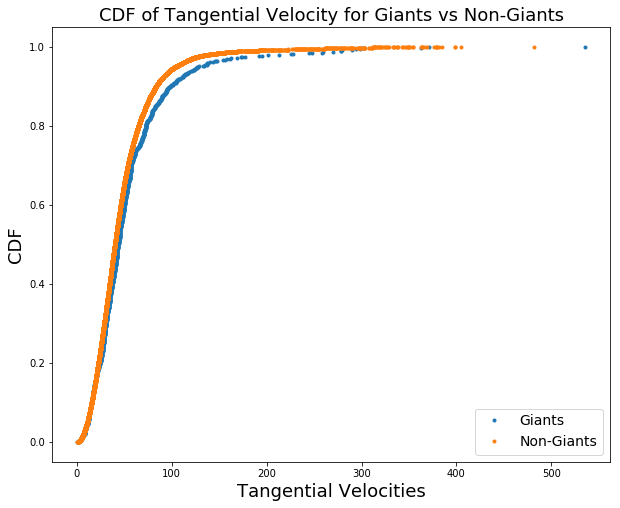

In [191]:
vtan_giant_x, vtan_giant_y = cdf(giant_vtan)
vtan_notgiant_x, vtan_notgiant_y = cdf(nogiant_vtan)

# Plot it up!
fig, axes = plt.subplots(figsize=(10,8))
_ = axes.plot(vtan_giant_x, vtan_giant_y, marker='.', linestyle='none')
_ = axes.plot(vtan_notgiant_x, vtan_notgiant_y, marker='.', linestyle='none')
_ = axes.legend(['Giants', 'Non-Giants'], fontsize=14)
_ = axes.set_xlabel('Tangential Velocities', fontsize=18)
_ = axes.set_ylabel('CDF', fontsize=18)
_ = plt.title('CDF of Tangential Velocity for Giants vs Non-Giants', fontsize=18)
plt.show()

In [192]:
# Let's do a z-test comparison of the mean velocities for giants and non-giants assuming log-normal dists:
mu_giants, sigma_giants = log_norm_calc_params(giant_vtan)
mu_nogiants, sigma_nogiants = log_norm_calc_params(nogiant_vtan)

z_stat_giants = (mu_nogiants - mu_giants) / np.sqrt((sigma_nogiants*sigma_nogiants/len(nogiant_vtan))
                                         +(sigma_giants*sigma_giants/len(giant_vtan)))
# Figure out the 95% confidence intervals:
print('95% confidence interval z-table range: ')
print([st.norm.ppf(.025), st.norm.ppf(.975)])

p = st.norm.cdf(z_stat_giants)
print('Z value = {}'.format(z_stat_giants))
print('p value: {}'.format(p))

95% confidence interval z-table range: 
[-1.9599639845400545, 1.959963984540054]
Z value = -3.7089249444557955
p value: 0.00010407055496127738
